<center>
    <h1>
        <center><i> Neural Networks</i></center>
        <center><i>Credit Card Fraud Detection</i></center>
    </h1>
     <div style="float: right">  
         <p style="float: left;"><b>Instructor : Abdelkader BOUSABAA &nbsp;  <br>
                                     Student: Phung TRAN &nbsp;  <br>
                                    IMSD Master 2020-2021  </b>
         </p>
      </div>
<br><br>
<hr>
</center> 

## Dataset 
Feature 'Time' contains the seconds elapsed between each transaction and the first transaction in the dataset. The feature 'Amount' is the transaction Amount, this feature can be used for example-dependant cost-senstive learning. Feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise. 


In [ ]:
# Imported Libraries

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA, TruncatedSVD
import matplotlib.patches as mpatches
import time

# Classifier Libraries
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
import collections


# Other Libraries
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import make_pipeline as imbalanced_make_pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
from imblearn.metrics import classification_report_imbalanced
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, confusion_matrix, classification_report, make_scorer
from collections import Counter
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import GridSearchCV
from mlxtend.plotting import plot_confusion_matrix
from numpy import mean, std
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

import warnings
warnings.filterwarnings("ignore")

In [ ]:
#Use to import the file into google Colab drive
from google.colab import files 
#Use to import io, which opens the file from the Colab drive
import io

# This will open a widget when run that will enable you to browse the files on your local storage drive.
uploaded = files.upload()

Saving creditcard.csv to creditcard.csv


In [ ]:
df = pd.read_csv('creditcard.csv')
df.head(20)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
5,2.0,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,-0.371407,1.341262,0.359894,-0.358091,-0.137134,0.517617,0.401726,-0.058133,0.068653,-0.033194,0.084968,-0.208254,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,0.081080,3.67,0
6,4.0,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,-0.099254,-1.416907,-0.153826,-0.751063,0.167372,0.050144,-0.443587,0.002821,-0.611987,-0.045575,-0.219633,-0.167716,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,0.005168,4.99,0
7,7.0,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,-0.619468,0.291474,1.757964,-1.323865,0.686133,-0.076127,-1.222127,-0.358222,0.324505,-0.156742,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
8,7.0,-0.894286,0.286157,-0.113192,-0.271526,2.669599,3.721818,0.370145,0.851084,-0.392048,-0.410430,-0.705117,-0.110452,-0.286254,0.074355,-0.328783,-0.210077,-0.499768,0.118765,0.570328,0.052736,-0.073425,-0.268092,-0.204233,1.011592,0.373205,-0.384157,0.011747,0.142404,93.20,0
9,9.0,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,-0.366846,1.017614,0.836390,1.006844,-0.443523,0.150219,0.739453,-0.540980,0.476677,0.451773,0.203711,-0.246914,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,3.68,0


# Exploratory data analysis

In [ ]:
df.info()
# No null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

-


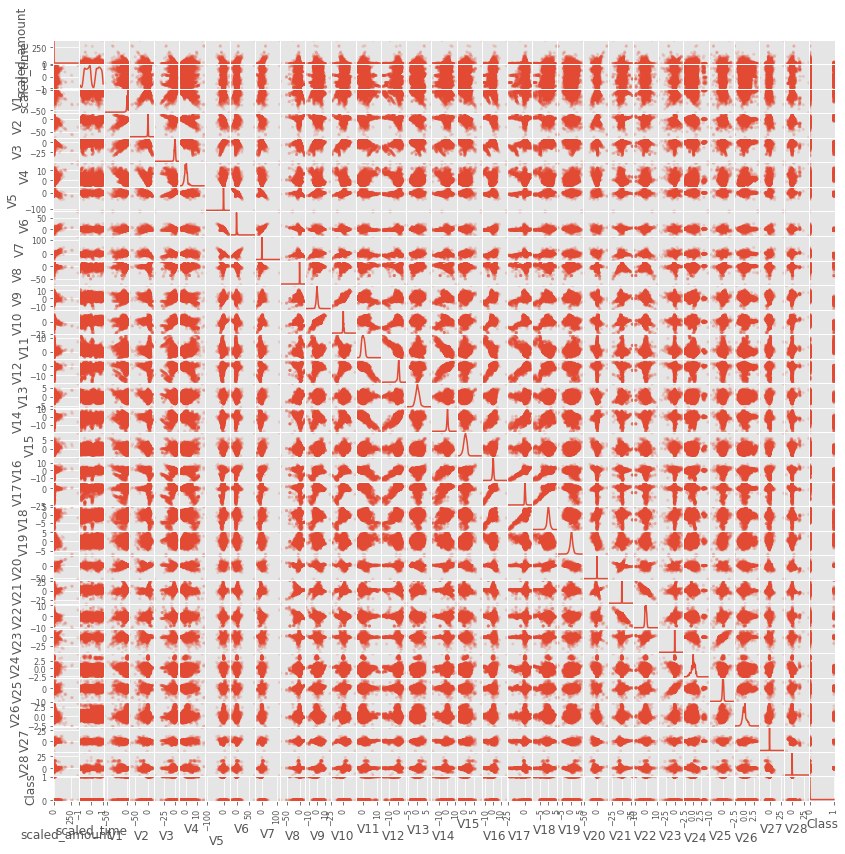

In [ ]:
from pandas.plotting import scatter_matrix
scatter_matrix(df.loc[:, "V1":"V28"], alpha=0.2, figsize=(14, 14), diagonal='kde')
print("-");

In [ ]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,...,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


             mean       max  min
Class                           
0       88.291022  25691.16  0.0
1      122.211321   2125.87  0.0


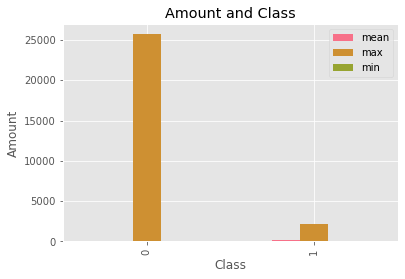

In [ ]:
with sns.color_palette("husl", 8): 

    ClassAmount = df.groupby('Class').agg(['mean','max','min']).Amount
    
    print(ClassAmount)

    ClassAmount.plot(kind='bar')
    plt.xlabel('Class')
    plt.ylabel('Amount')
    plt.title('Amount and Class')

               mean       max    min
Class                               
0      94838.202258  172792.0    0.0
1      80746.806911  170348.0  406.0


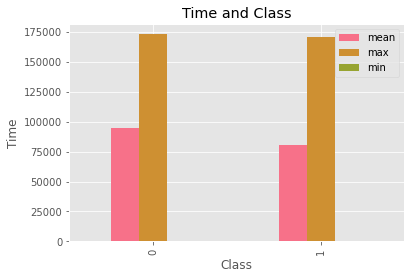

In [ ]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12,6))
s = sns.boxplot(ax = ax1, x="Class", y="Amount", hue="Class",data=data_df, palette="PRGn",showfliers=True)
s = sns.boxplot(ax = ax2, x="Class", y="Amount", hue="Class",data=data_df, palette="PRGn",showfliers=False)
plt.show();

In [ ]:
df.Class.value_counts()

0    284315
1       492
Name: Class, dtype: int64

In [ ]:
df.Amount.value_counts()

1.00       13688
1.98        6044
0.89        4872
9.99        4747
15.00       3280
           ...  
192.63         1
218.84         1
195.52         1
793.50         1
1080.06        1
Name: Amount, Length: 32767, dtype: int64

In [ ]:
df.Time.value_counts()

163152.0    36
64947.0     26
68780.0     25
3767.0      21
3770.0      20
            ..
2088.0       1
64100.0      1
42068.0      1
119630.0     1
140344.0     1
Name: Time, Length: 124592, dtype: int64

In [ ]:
# selecting Positive rows 
Fraud_df = df[df['Class'] == 1] 
Fraud_df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
541,406.0,-2.312227,1.951992,-1.609851,3.997906,-0.522188,-1.426545,-2.537387,1.391657,-2.770089,...,0.517232,-0.035049,-0.465211,0.320198,0.044519,0.177840,0.261145,-0.143276,0.00,1
623,472.0,-3.043541,-3.157307,1.088463,2.288644,1.359805,-1.064823,0.325574,-0.067794,-0.270953,...,0.661696,0.435477,1.375966,-0.293803,0.279798,-0.145362,-0.252773,0.035764,529.00,1
4920,4462.0,-2.303350,1.759247,-0.359745,2.330243,-0.821628,-0.075788,0.562320,-0.399147,-0.238253,...,-0.294166,-0.932391,0.172726,-0.087330,-0.156114,-0.542628,0.039566,-0.153029,239.93,1
6108,6986.0,-4.397974,1.358367,-2.592844,2.679787,-1.128131,-1.706536,-3.496197,-0.248778,-0.247768,...,0.573574,0.176968,-0.436207,-0.053502,0.252405,-0.657488,-0.827136,0.849573,59.00,1
6329,7519.0,1.234235,3.019740,-4.304597,4.732795,3.624201,-1.357746,1.713445,-0.496358,-1.282858,...,-0.379068,-0.704181,-0.656805,-1.632653,1.488901,0.566797,-0.010016,0.146793,1.00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
279863,169142.0,-1.927883,1.125653,-4.518331,1.749293,-1.566487,-2.010494,-0.882850,0.697211,-2.064945,...,0.778584,-0.319189,0.639419,-0.294885,0.537503,0.788395,0.292680,0.147968,390.00,1
280143,169347.0,1.378559,1.289381,-5.004247,1.411850,0.442581,-1.326536,-1.413170,0.248525,-1.127396,...,0.370612,0.028234,-0.145640,-0.081049,0.521875,0.739467,0.389152,0.186637,0.76,1
280149,169351.0,-0.676143,1.126366,-2.213700,0.468308,-1.120541,-0.003346,-2.234739,1.210158,-0.652250,...,0.751826,0.834108,0.190944,0.032070,-0.739695,0.471111,0.385107,0.194361,77.89,1
281144,169966.0,-3.113832,0.585864,-5.399730,1.817092,-0.840618,-2.943548,-2.208002,1.058733,-1.632333,...,0.583276,-0.269209,-0.456108,-0.183659,-0.328168,0.606116,0.884876,-0.253700,245.00,1


In [ ]:
# The dataset is highly skewed, the positive class (frauds) account for 0.173% of all transactions.
print('No Frauds / Negative Class : ', round(df['Class'].value_counts()[0]/len(df) * 100,3), '% of the dataset, being', df['Class'].value_counts()[0], 'transactions')
print('Frauds / Positive Class : ', round(df['Class'].value_counts()[1]/len(df) * 100,3), '% of the dataset, being', df['Class'].value_counts()[1], 'transactions')

No Frauds / Negative Class :  99.827 % of the dataset, being 284315 transactions
Frauds / Positive Class :  0.173 % of the dataset, being 492 transactions


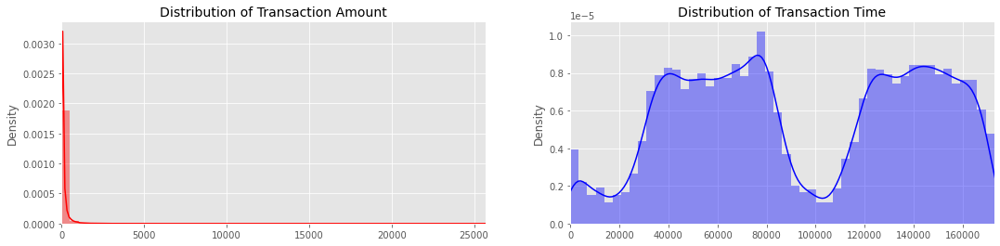

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(18,4))

amount_val = df['Amount'].values
time_val = df['Time'].values

sns.distplot(amount_val, ax=ax[0], color='r')
ax[0].set_title('Distribution of Transaction Amount', fontsize=14)
ax[0].set_xlim([min(amount_val), max(amount_val)])

sns.distplot(time_val, ax=ax[1], color='b')
ax[1].set_title('Distribution of Transaction Time', fontsize=14)
ax[1].set_xlim([min(time_val), max(time_val)])

plt.show()

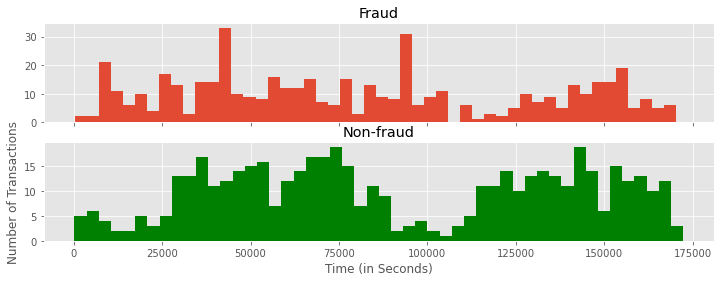

In [ ]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,4))

bins = 50

ax1.hist(df.Time[df.Class == 1], bins = bins)
ax1.set_title('Fraud')

ax2.hist(df.Time[df.Class == 0], bins = bins, color = 'g')
ax2.set_title('Non-fraud')

plt.xlabel('Time (in Seconds)')
plt.ylabel('Number of Transactions')
plt.show()

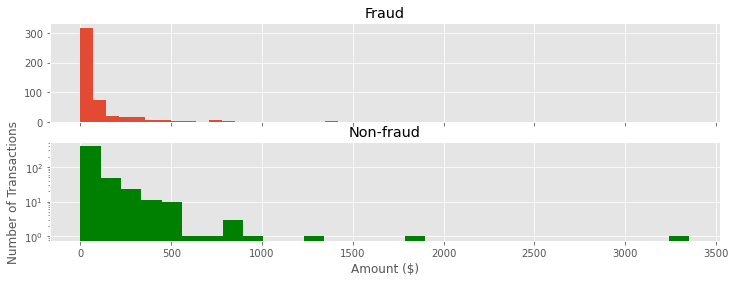

In [ ]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,4))

bins = 30

ax1.hist(df.Amount[df.Class == 1], bins = bins)
ax1.set_title('Fraud')

ax2.hist(df.Amount[df.Class == 0], bins = bins, color = 'g')
ax2.set_title('Non-fraud')

plt.xlabel('Amount ($)')
plt.ylabel('Number of Transactions')
plt.yscale('log')
plt.show()

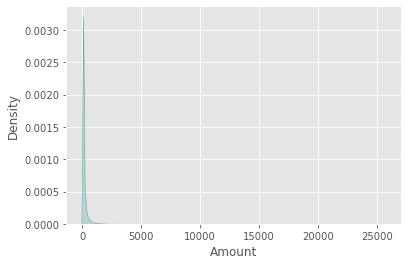

In [ ]:
sns.kdeplot(df[df.Class == 0].Amount, shade=True, color = "#459D97", label='Estimated PDF of Amount in non-fraudulent transactions') 

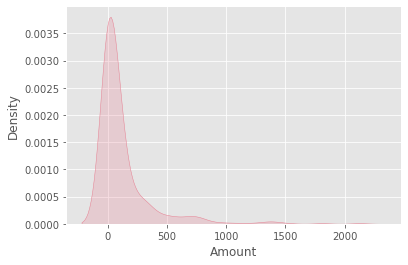

In [ ]:
sns.kdeplot(df[df.Class == 1].Amount, shade=True, color = "#E68193", label='Estimated PDF of Amount in fraudulent transactions') 

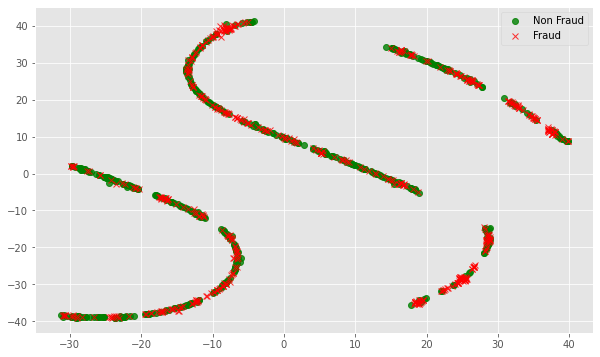

In [ ]:
# Visualize Fraud and Non Fraud Transactions

non_fraud = df[df['Class'] == 0].sample(492)
fraud = df[df['Class'] == 1]

df = non_fraud.append(fraud).sample(frac=1).reset_index(drop=True)
X = df.drop(['Class'], axis = 1).values
Y = df["Class"].values


def tsne_plot(x1, y1, name="graph.png"):
    tsne = TSNE(n_components=2, random_state=0)
    X_t = tsne.fit_transform(x1)

    plt.figure(figsize=(10, 6))
    plt.scatter(X_t[np.where(y1 == 0), 0], X_t[np.where(y1 == 0), 1], marker='o', color='g', linewidth='1', alpha=0.8, label='Non Fraud')
    plt.scatter(X_t[np.where(y1 == 1), 0], X_t[np.where(y1 == 1), 1], marker='x', color='r', linewidth='1', alpha=0.8, label='Fraud')

    plt.legend(loc='best');
    plt.savefig(name);
    plt.show();
    
tsne_plot(X, Y, "original.png")

## Exploring features 

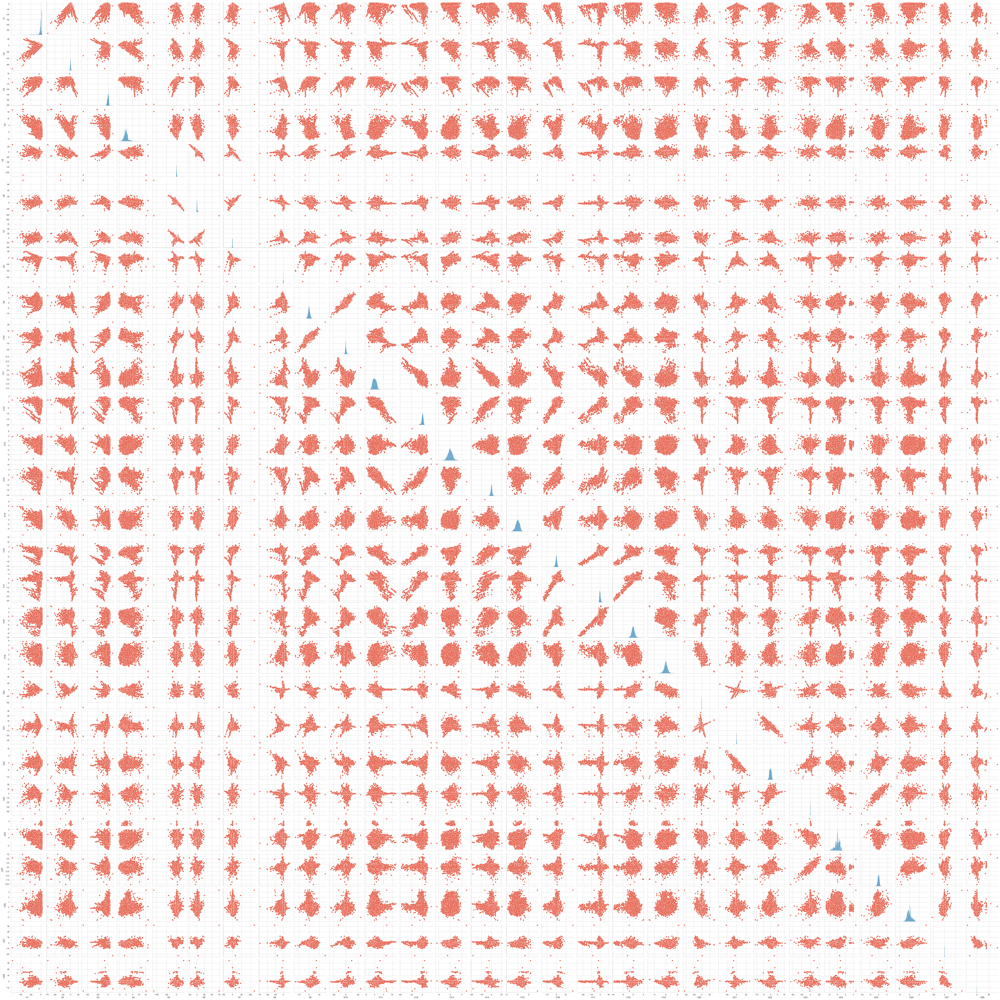

In [ ]:
sns.pairplot(df.loc[:, "V1":"V28"])

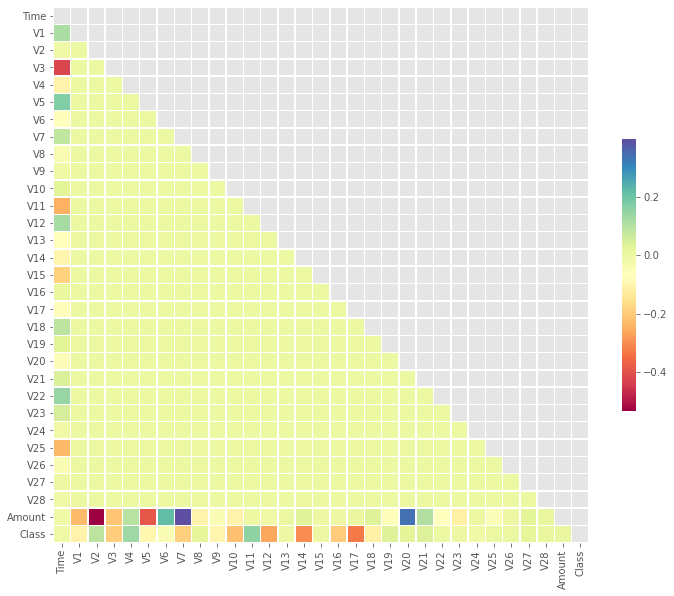

In [ ]:
# Compute the correlation matrix
corr = df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12,10))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, cmap="Spectral", mask=mask, annot=False,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

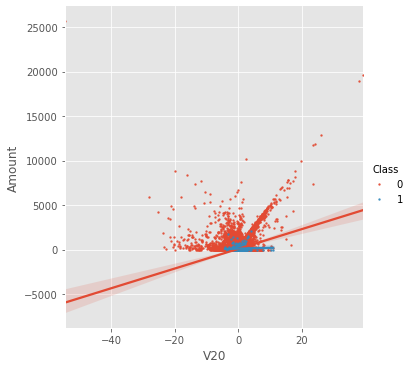

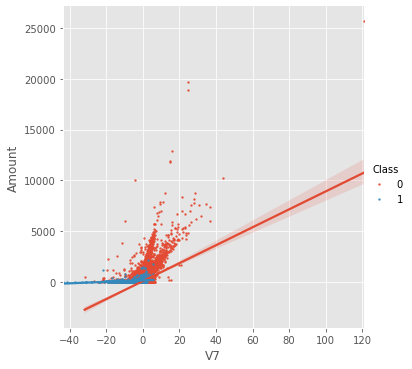

In [ ]:
s = sns.lmplot(x='V20', y='Amount',data=df, hue='Class', fit_reg=True,scatter_kws={'s':2})
s = sns.lmplot(x='V7', y='Amount',data=df, hue='Class', fit_reg=True,scatter_kws={'s':2})
plt.show()

<Figure size 432x288 with 0 Axes>

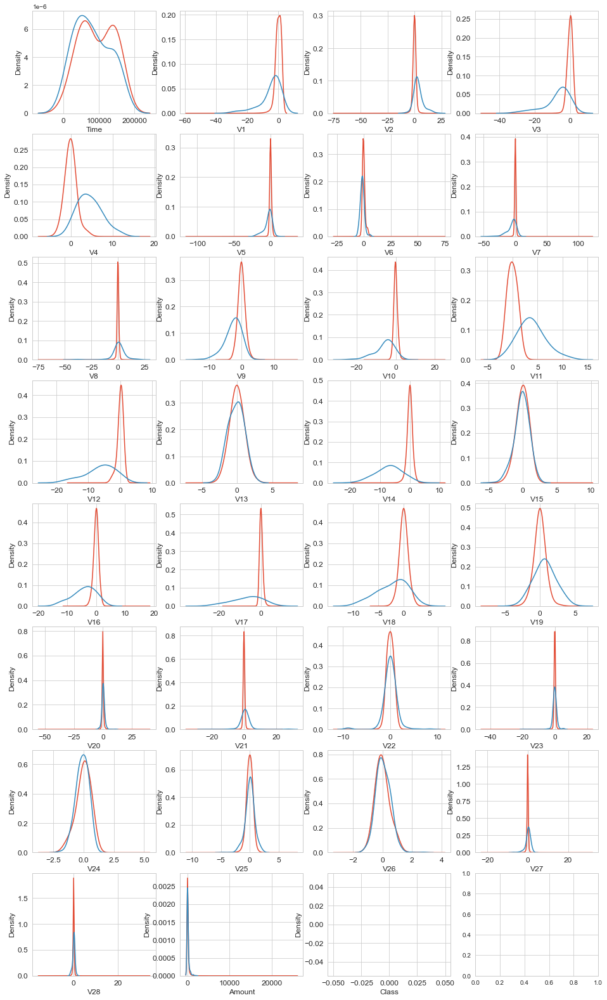

In [ ]:
# Features density plot for 2 classes

var = df.columns.values

i = 0
t0 = df.loc[df['Class'] == 0]
t1 = df.loc[df['Class'] == 1]

sns.set_style('whitegrid')
plt.figure()
fig, ax = plt.subplots(8,4,figsize=(16,28))

for feature in var:
    i += 1
    plt.subplot(8,4,i)
    sns.kdeplot(t0[feature], bw=0.5,label="Class = 0")
    sns.kdeplot(t1[feature], bw=0.5,label="Class = 1")
    plt.xlabel(feature, fontsize=12)
    locs, labels = plt.xticks()
    plt.tick_params(axis='both', which='major', labelsize=12)
plt.show();

# Scaling and Distributing

Objective: Creating a dataframe with a 50/50 ratio of fraud and non-fraud transactions.

## Scaling

In [ ]:
# Since most of our data has already been scaled we should scale the columns that are left to scale (Amount and Time)

# the centering and scaling statistics of RobustScaler is based on percentiles 
# and are therefore not influenced by a few number of very large marginal outliers. 

std_scaler = StandardScaler()
rob_scaler = RobustScaler()

df['scaled_amount'] = rob_scaler.fit_transform(df['Amount'].values.reshape(-1,1))
df['scaled_time'] = rob_scaler.fit_transform(df['Time'].values.reshape(-1,1))

df.drop(['Time','Amount'], axis=1, inplace=True)

In [ ]:
scaled_amount = df['scaled_amount']
scaled_time = df['scaled_time']

df.drop(['scaled_amount', 'scaled_time'], axis=1, inplace=True)
df.insert(0, 'scaled_amount', scaled_amount)
df.insert(1, 'scaled_time', scaled_time)

# Amount and Time are Scaled!

df.head()

,scaled_amount,scaled_time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
0,1.783274,-0.994983,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0
1,-0.269825,-0.994983,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0
2,4.983721,-0.994972,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0
3,1.418291,-0.994972,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0
4,0.670579,-0.994960,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0


In [ ]:
X = df.drop('Class', axis=1)
y = df['Class']

## Random Under-Sampling:

"Random Under Sampling" consists of removing data in order to have a more balanced dataset and thus avoiding our models to overfitting.

In [ ]:
# Since our classes are highly skewed we should make them equivalent in order to have a normal distribution of the classes.

# shuffle the data before creating the subsamples
df = df.sample(frac=1)

# amount of fraud classes 492 rows.
fraud_df = df.loc[df['Class'] == 1]
non_fraud_df = df.loc[df['Class'] == 0][:492]

normal_distributed_df = pd.concat([fraud_df, non_fraud_df])

# Shuffle dataframe rows
UnderSampling_df = normal_distributed_df.sample(frac=1, random_state=42)

UnderSampling_df

,scaled_amount,scaled_time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
197079,0.782505,0.553825,2.106307,-1.837092,0.079177,-1.336469,-2.202143,-0.482491,-1.734326,-0.016122,-0.525022,1.451894,-1.143759,-0.799739,0.351476,-0.864267,0.110357,-0.088258,0.345803,0.309051,-0.354251,-0.312740,-0.108256,0.100369,0.296463,0.012628,-0.581307,-0.254050,0.053236,-0.018967,0
150668,2.326836,0.107708,-10.632375,7.251936,-17.681072,8.204144,-10.166591,-4.510344,-12.981606,6.783589,-4.659330,-14.924655,8.389142,-16.465504,0.338517,-14.224404,0.556584,-11.683998,-15.841616,-5.753200,3.813041,-0.810146,2.715357,0.695603,-1.138122,0.459442,0.386337,0.522438,-1.416604,-0.488307,1
176291,1.384755,0.446575,1.934562,-0.390607,-2.247778,0.309727,0.635271,-0.714690,0.671454,-0.421665,0.412196,0.058982,-1.788928,-0.017906,0.004698,0.418893,-0.339315,-0.354634,-0.370140,-0.557627,0.483618,0.019972,0.006117,-0.011878,-0.180458,-0.989406,0.319812,0.662847,-0.120919,-0.070083,0
275992,8.555858,0.964990,-2.027135,-1.131890,-1.135194,1.086963,-0.010547,0.423797,3.790880,-1.155595,-0.063434,1.334414,1.032016,-0.722023,-1.533240,0.334119,0.297479,-0.429392,-0.824644,0.489668,0.873344,0.033804,-0.315105,0.575520,0.490842,0.756502,-0.142685,-0.602777,0.508712,-0.091646,1
249607,0.181653,0.820040,-7.381547,-7.449015,-4.696287,3.728439,6.198304,-6.406267,-5.831452,1.457175,-0.646203,-4.029129,2.528943,-3.308722,-1.992010,-5.757216,-0.877323,-1.547552,-1.909017,0.500567,0.136722,2.932758,1.176575,-0.978692,-0.278330,-0.635874,0.123539,0.404729,0.704915,-1.229992,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43624,0.243834,-0.506467,-1.048005,1.300219,-0.180401,2.589843,-1.164794,0.031823,-2.175778,0.699072,-1.140208,-3.226787,3.490805,-2.454339,0.177189,-5.160608,-0.686114,-3.996145,-4.695563,-1.819161,1.461080,0.644993,0.549014,0.624321,-0.136663,0.131738,0.030921,-0.176701,0.504898,0.069882,1
102441,-0.293440,-0.193670,-13.192671,12.785971,-9.906650,3.320337,-4.801176,5.760059,-18.750889,-37.353443,-0.391540,-5.052502,4.406806,-4.610756,-1.909488,-9.072711,-0.226074,-6.211557,-6.248145,-3.149247,0.051576,-3.493050,27.202839,-8.887017,5.303607,-0.639435,0.263203,-0.108877,1.269566,0.939407,1
159449,-0.135401,0.326543,-0.305829,1.341933,-0.945398,-0.430482,1.680380,-0.517061,1.159780,-0.100238,-0.095750,-1.673767,-1.051420,-0.413210,0.435692,-2.938875,-0.805453,0.483306,1.635798,0.967391,-0.125969,0.183308,-0.003833,0.346202,-0.417855,-0.039316,0.114427,0.682011,0.372622,0.278507,0
245347,-0.272899,0.799093,0.051075,1.310427,0.733222,2.620282,1.402358,0.528489,1.086014,-0.146423,-1.724333,1.280167,0.470865,0.435542,0.594974,-0.142099,-2.024735,0.828291,-1.274787,0.134277,-1.489434,-0.125877,0.229936,0.766927,-0.189624,0.766853,-0.141401,-0.077278,-0.297595,-0.221816,1


In [ ]:
X_UnderSampling = UnderSampling_df.drop(['Class'],axis=1)
y_UnderSampling = UnderSampling_df['Class']

## Over-Sampling (SMOTE)

In [ ]:
# transform the dataset
oversample = SMOTE()
X_OverSampling, y_OverSampling = oversample.fit_resample(X, y)

In [ ]:
# summarize the new class distribution
print(Counter(y_OverSampling))

Counter({0: 284315, 1: 284315})


# Model Testing

## Useful functions

In [ ]:

def print_score(label, prediction, train=True):
    if train:
        clf_report = pd.DataFrame(classification_report(label, prediction, output_dict=True))
        print("================================================\nTRAIN RESULT\n================================================")
        print(f"Accuracy Score: {accuracy_score(label, prediction) * 100:.2f}%")
        print("_______________________________________________")
        print(f"Classification Report:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, prediction)}\n")
        
    elif train==False:
        clf_report = pd.DataFrame(classification_report(label, prediction, output_dict=True))
        print("================================================\nTEST RESULT\n================================================")        
        print(f"Accuracy Score: {accuracy_score(label, prediction) * 100:.2f}%")
        print("_______________________________________________")
        print(f"Classification Report:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(label, prediction)}\n") 
        

In [ ]:


# Split the data into training and testing subsets
X_trainUnderSampling, X_testUnderSampling, y_trainUnderSampling, y_testUnderSampling = train_test_split(X_UnderSampling, y_UnderSampling, test_size = 0.25, random_state = 12)

X_train.shape:  (738, 30)
X_test.shape:  (246, 30)
y_train.shape:  (738,)
y_test.shape:  (246,)
-----------------------------------------------------------------------------------
                                Support Vector Machine                             
-----------------------------------------------------------------------------------
*****************************************************************
Area under the curve : 0.937338
Average precision-recall score RF: 0.9312759113964238
[[112   3]
 [ 13 118]]
              precision    recall  f1-score   support

           0       0.90      0.97      0.93       115
           1       0.98      0.90      0.94       131

    accuracy                           0.93       246
   macro avg       0.94      0.94      0.93       246
weighted avg       0.94      0.93      0.94       246

*****************************************************************


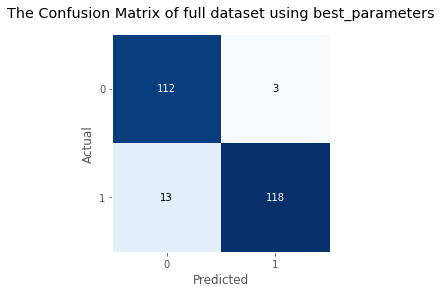

The accuracy is 93.4959349593496 %
The recall from the confusion matrix is 90.07633587786259 %


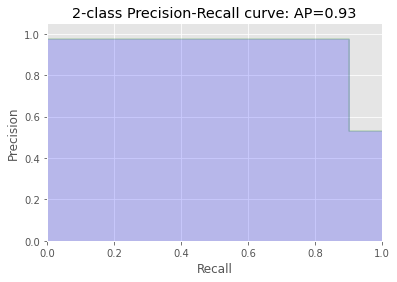

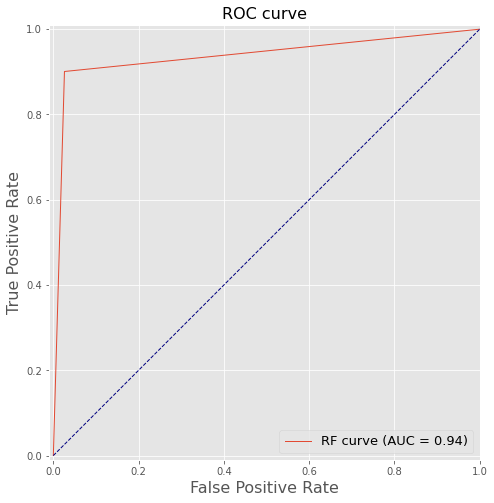

This solution took 4.4e+02 s


In [ ]:
# Applying SVM Algorithm
print("-----------------------------------------------------------------------------------")
print("                                Support Vector Machine                             ")              
print("-----------------------------------------------------------------------------------")

t0 = time.time()

#Using the rbf kernel to build the initail model.
classifier= svm.SVC(C= 1, kernel= 'linear', random_state= 0)

#Fit into Model
classifier.fit(X_train, y_train)

#Predict the class using X_test
y_pred = classifier.predict(X_test)

con_mat = confusion_matrix(y_test, y_pred)
average_precision = average_precision_score(y_test, y_pred)
cls_report = classification_report(y_test, y_pred)

print("*****************************************************************")
print("Area under the curve : %f" % (roc_auc_score(y_test, y_pred)))
print("Average precision-recall score RF: {}".format(average_precision))
print(con_mat)
print(cls_report)
print("*****************************************************************")

def confus_matrix(CM):
    fig, ax = plot_confusion_matrix(conf_mat= CM)
    plt.title("The Confusion Matrix of full dataset using best_parameters")
    plt.ylabel("Actual")
    plt.xlabel("Predicted")
    plt.show()
    print("The accuracy is "+str((CM[1,1]+CM[0,0])/(CM[0,0] + CM[0,1]+CM[1,0] + CM[1,1])*100) + " %")
    print("The recall from the confusion matrix is "+ str(CM[1,1]/(CM[1,0] + CM[1,1])*100) +" %")
confus_matrix(con_mat)

precision, recall, _ = precision_recall_curve(y_test, y_pred)
plt.step(recall, precision, color='g', alpha=0.2, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(average_precision))

fpr_rf, tpr_rf, _ = roc_curve(y_test, y_pred)
roc_auc_rf = auc(fpr_rf, tpr_rf)
plt.figure(figsize=(8,8))
plt.xlim([-0.01, 1.00])
plt.ylim([-0.01, 1.01])
plt.plot(fpr_rf, tpr_rf, lw=1, label='{} curve (AUC = {:0.2f})'.format('RF',roc_auc_rf))

plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc='lower right', fontsize=13)
plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
plt.axes().set_aspect('equal')
plt.show()

t1 = time.time()

print("This solution took {:.2} s".format(t1 - t0))

SVM is relatively memory efficient, however SVM is not suitable for large data sets (in case we use OverSampling) and it doesn’t perform very well when the data set has more noise i.e. target classes are overlapping

## Testing models with UnderSampling

>DecisionTree 0.927 (0.025)
>KNN 0.971 (0.013)
>BAG 0.983 (0.009)
>RF 0.983 (0.010)
>ET 0.985 (0.008)
>AB 0.980 (0.020)
>GB 0.979 (0.013)
-------------------------------------------------------------------
          Testing different nonlinear algorithms: PR AUC              
-------------------------------------------------------------------


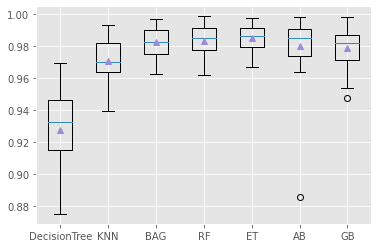

This solution took 6.2e+01 s


In [ ]:

# calculate precision-recall area under curve
def pr_auc(y_true, probas_pred):
    # calculate precision-recall curve
    p, r, _ = precision_recall_curve(y_true, probas_pred)
    # calculate area under curve
    return auc(r, p)

t0 = time.time()

# evaluate a model
def evaluate_model(X_UnderSampling, y_UnderSampling, model):
    # define evaluation procedure
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    # define the model evaluation the metric
    metric = make_scorer(pr_auc, needs_proba=True)
    # evaluate model
    scores = cross_val_score(model, X_UnderSampling, y_UnderSampling, scoring=metric, cv=cv, n_jobs=-1)
    return scores

# define models to test
def get_models():
    models, names = list(), list()
    # DecisionTree
    models.append(DecisionTreeClassifier())
    names.append('DecisionTree')
    # KNN
    steps = [('s',StandardScaler()),('m',KNeighborsClassifier())]
    models.append(Pipeline(steps=steps))
    names.append('KNN')
    # Bagging
    models.append(BaggingClassifier(n_estimators=100))
    names.append('BAG')
    # RF
    models.append(RandomForestClassifier(n_estimators=100))
    names.append('RF')
    # ET
    models.append(ExtraTreesClassifier(n_estimators=100))
    names.append('ET')
    # Adaboost
    models.append(AdaBoostClassifier(n_estimators=100, random_state=0))
    names.append('AB')
    # GradientBoosting
    models.append(GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0))
    names.append('GB')
    return models, names



# define models
models, names = get_models()
results = list()
# evaluate each model
for i in range(len(models)):
    # evaluate the model and store results
    scores = evaluate_model(X_UnderSampling, y_UnderSampling, models[i])
    results.append(scores)
    # summarize performance
    print('>%s %.3f (%.3f)' % (names[i], mean(scores), std(scores)))
# plot the results
print("-------------------------------------------------------------------")
print("          Testing different nonlinear algorithms: PR AUC              ")              
print("-------------------------------------------------------------------")
plt.boxplot(results, labels=names, showmeans=True)
plt.show()

t1 = time.time()
print("This step took {:.2} s".format(t1 - t0))

In [ ]:
ET_clf = ExtraTreesClassifier(n_estimators=100, random_state=0) 
ET_clf.fit(X_trainUnderSampling, y_trainUnderSampling)

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100,
                     n_jobs=None, oob_score=False, random_state=0, verbose=0,
                     warm_start=False)

In [ ]:
y_train_predUnderSampling = ET_clf.predict(X_trainUnderSampling)
y_test_predUnderSampling = ET_clf.predict(X_testUnderSampling)

print_score(y_trainUnderSampling, y_train_predUnderSampling.round(), train=True)
print_score(y_testUnderSampling, y_test_predUnderSampling.round(), train=False)

scores_dict = {
    'ET': {
        'Train': f1_score(y_trainUnderSampling, y_train_predUnderSampling.round()),
        'Test': f1_score(y_testUnderSampling, y_test_predUnderSampling.round()),
    },
}

TRAIN RESULT
Accuracy Score: 100.00%
_______________________________________________
Classification Report:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support    377.0  361.0       1.0      738.0         738.0
_______________________________________________
Confusion Matrix: 
 [[377   0]
 [  0 361]]

TEST RESULT
Accuracy Score: 92.28%
_______________________________________________
Classification Report:
                    0           1  accuracy   macro avg  weighted avg
precision    0.875000    0.974576  0.922764    0.924788      0.928026
recall       0.973913    0.877863  0.922764    0.925888      0.922764
f1-score     0.921811    0.923695  0.922764    0.922753      0.922814
support    115.000000  131.000000  0.922764  246.000000    246.000000
_______________________________________________
C

In [ ]:
print('====== Test also RF model ====== ')
print(' ')

X_UnderSampling = data.drop(['Class'],axis=1)
y_UnderSampling = data['Class']

# Split the data into training and testing subsets
X_trainUnderSampling, X_testUnderSampling, y_trainUnderSampling, y_testUnderSampling = train_test_split(X_UnderSampling, y_UnderSampling, test_size = 0.25, random_state = 12)

t0 = time.time()

RF_clf = RandomForestClassifier(n_estimators=100) 
RF_clf.fit(X_trainUnderSampling, y_trainUnderSampling)

y_train_predUnderSampling = RF_clf.predict(X_trainUnderSampling)
y_test_predUnderSampling = RF_clf.predict(X_testUnderSampling)

print_score(y_trainUnderSampling, y_train_predUnderSampling.round(), train=True)
print_score(y_testUnderSampling, y_test_predUnderSampling.round(), train=False)

scores_dict = {
    'RF': {
        'Train': f1_score(y_trainUnderSampling, y_train_predUnderSampling.round()),
        'Test': f1_score(y_testUnderSampling, y_test_predUnderSampling.round()),
    },
}

t1 = time.time()
print("This step took {:.2} s".format(t1 - t0))

====== Test also RF model ====== 
 
TRAIN RESULT
Accuracy Score: 100.00%
_______________________________________________
Classification Report:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support    377.0  361.0       1.0      738.0         738.0
_______________________________________________
Confusion Matrix: 
 [[377   0]
 [  0 361]]

TEST RESULT
Accuracy Score: 92.68%
_______________________________________________
Classification Report:
                    0           1  accuracy   macro avg  weighted avg
precision    0.875969    0.982906  0.926829    0.929437      0.932915
recall       0.982609    0.877863  0.926829    0.930236      0.926829
f1-score     0.926230    0.927419  0.926829    0.926824      0.926863
support    115.000000  131.000000  0.926829  246.000000    246.000000
_____________

## Testing models with OverSampling

In [ ]:
# calculate precision-recall area under curve
def pr_auc(y_true, probas_pred):
    # calculate precision-recall curve
    p, r, _ = precision_recall_curve(y_true, probas_pred)
    # calculate area under curve
    return auc(r, p)

t0 = time.time()

# evaluate a model
def evaluate_model(X_OverSampling, y_OverSampling, model):
    # define evaluation procedure
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    # define the model evaluation the metric
    metric = make_scorer(pr_auc, needs_proba=True)
    # evaluate model
    scores = cross_val_score(model, X_OverSampling, y_OverSampling, scoring=metric, cv=cv, n_jobs=-1)
    return scores


In [ ]:
# evaluate each model
for i in range(len(models)):
    # evaluate the model and store results
    scores = evaluate_model(X_OverSampling, y_OverSampling, models[i])
    results.append(scores)
    # summarize performance
    print('>%s %.3f (%.3f)' % (names[i], mean(scores), std(scores)))
# plot the results
print("-------------------------------------------------------------------")
print("          OverSampling / PR AUC              ")              
print("-------------------------------------------------------------------")
plt.boxplot(results, labels=names, showmeans=True)
plt.show()

t1 = time.time()
print("This step took {} s".format(t1 - t0))

>DecisionTree 0.999 (0.000)
>KNN 1.000 (0.000)


KeyboardInterrupt: ignored

as it has taken too long....

In [ ]:
 
t1 = time.time()
print("This step took {} s".format(t1 - t0))

This step took 13927.575682640076 s


# Neural networks

## ANNs

### UnderSampling

-------------------------------------------------------------------
         ANNs / UnderSampling / SUMMARY              
-------------------------------------------------------------------
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               7936      
_________________________________________________________________
batch_normalization (BatchNo (None, 256)               1024      
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               65792     
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
________________________________________________________________

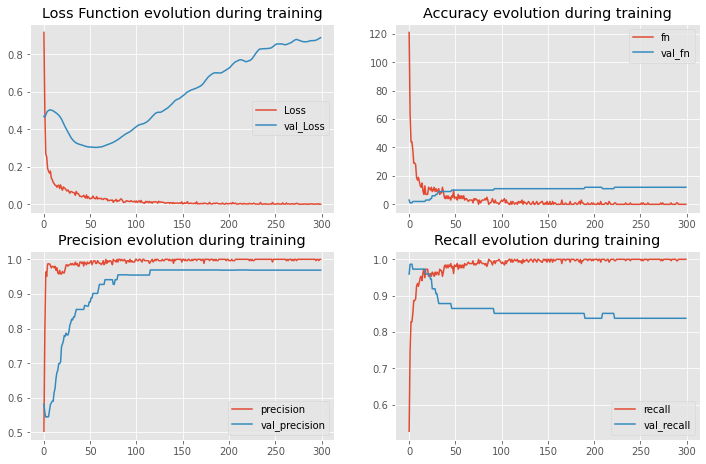

In [ ]:
t0 = time.time()

X_train_validate, X_test, y_train_validate, y_test = train_test_split(X_UnderSampling, y_UnderSampling, 
                                                    test_size=0.3, random_state=42)
X_train, X_validate, y_train, y_validate = train_test_split(X_train_validate, y_train_validate, 
                                                            test_size=0.2, random_state=42)

from tensorflow import keras

model = keras.Sequential([
    keras.layers.Dense(256, activation='relu', input_shape=(X_train.shape[-1],)),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.3),
    keras.layers.Dense(256, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.3),
    keras.layers.Dense(256, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.3),
    keras.layers.Dense(1, activation='sigmoid'),
])

print("-------------------------------------------------------------------")
print("         ANNs / UnderSampling / SUMMARY              ")              
print("-------------------------------------------------------------------")
model.summary()

METRICS = [
#     keras.metrics.Accuracy(name='accuracy'),
    keras.metrics.FalseNegatives(name='fn'),
    keras.metrics.FalsePositives(name='fp'),
    keras.metrics.TrueNegatives(name='tn'),
    keras.metrics.TruePositives(name='tp'),
    keras.metrics.Precision(name='precision'),
    keras.metrics.Recall(name='recall')
]

model.compile(optimizer=keras.optimizers.Adam(1e-3), loss='binary_crossentropy', metrics=METRICS)

callbacks = [keras.callbacks.ModelCheckpoint('fraud_model_at_epoch_{epoch}.h5')]
w_p = y_train.value_counts()[0] / len(y_train)
w_n = y_train.value_counts()[1] / len(y_train)
class_weight = {0:w_p, 1:w_n}

r = model.fit(
    X_train, y_train, 
    validation_data=(X_validate, y_validate),
    batch_size=2048, 
    epochs=300, 
#     class_weight=class_weight,
    callbacks=callbacks,
)
print("          ")   
print("-------------------------------------------------------------------")
print("         ANNs / UnderSampling / SCORE              ")              
print("-------------------------------------------------------------------")
score = model.evaluate(X_test, y_test)
print(score)


print("          ")   
print("-------------------------------------------------------------------")
print("         ANNs / UnderSampling / VIZ              ")              
print("-------------------------------------------------------------------")
plt.figure(figsize=(12, 16))

plt.subplot(4, 2, 1)
plt.plot(r.history['loss'], label='Loss')
plt.plot(r.history['val_loss'], label='val_Loss')
plt.title('Loss Function evolution during training')
plt.legend()

plt.subplot(4, 2, 2)
plt.plot(r.history['fn'], label='fn')
plt.plot(r.history['val_fn'], label='val_fn')
plt.title('Accuracy evolution during training')
plt.legend()

plt.subplot(4, 2, 3)
plt.plot(r.history['precision'], label='precision')
plt.plot(r.history['val_precision'], label='val_precision')
plt.title('Precision evolution during training')
plt.legend()

plt.subplot(4, 2, 4)
plt.plot(r.history['recall'], label='recall')
plt.plot(r.history['val_recall'], label='val_recall')
plt.title('Recall evolution during training')
plt.legend()


y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

print_score(y_train, y_train_pred.round(), train=True)
print_score(y_test, y_test_pred.round(), train=False)


print("          ")
scores_dict = {
    'ANNs': {
        'Train': f1_score(y_train, y_train_pred.round()),
        'Test': f1_score(y_test, y_test_pred.round()),
    },
}


t1 = time.time()
print("ANNs / UnderSampling took {} s".format(t1 - t0))

### OverSampling

-------------------------------------------------------------------
         ANNs / OverSampling / SUMMARY              
-------------------------------------------------------------------
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 256)               7936      
_________________________________________________________________
batch_normalization_6 (Batch (None, 256)               1024      
_________________________________________________________________
dropout_6 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 256)               65792     
_________________________________________________________________
batch_normalization_7 (Batch (None, 256)               1024      
_______________________________________________________________

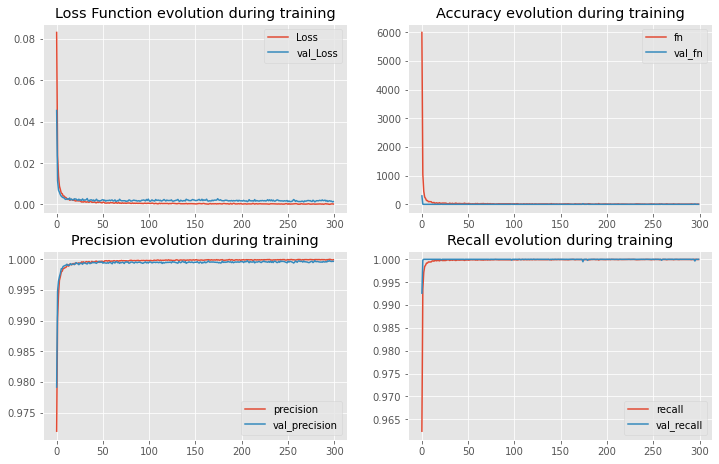

In [ ]:
t0 = time.time()

X_train_validate, X_test, y_train_validate, y_test = train_test_split(X_OverSampling, y_OverSampling, 
                                                    test_size=0.3, random_state=42)
X_train, X_validate, y_train, y_validate = train_test_split(X_train_validate, y_train_validate, 
                                                            test_size=0.2, random_state=42)

from tensorflow import keras

model = keras.Sequential([
    keras.layers.Dense(256, activation='relu', input_shape=(X_train.shape[-1],)),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.3),
    keras.layers.Dense(256, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.3),
    keras.layers.Dense(256, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.3),
    keras.layers.Dense(1, activation='sigmoid'),
])

print("-------------------------------------------------------------------")
print("         ANNs / OverSampling / SUMMARY              ")              
print("-------------------------------------------------------------------")
model.summary()


model.compile(optimizer=keras.optimizers.Adam(1e-3), loss='binary_crossentropy', metrics=METRICS)

callbacks = [keras.callbacks.ModelCheckpoint('fraud_model_at_epoch_{epoch}.h5')]
# w_p = y_train.value_counts()[0] / len(y_train)
# w_n = y_train.value_counts()[1] / len(y_train)
# class_weight = {0:w_p, 1:w_n}

r = model.fit(
    X_train, y_train, 
    validation_data=(X_validate, y_validate),
    batch_size=2048, 
    epochs=300, 
#     class_weight=class_weight,
    callbacks=callbacks,
)
print("          ")   
print("-------------------------------------------------------------------")
print("         ANNs / OverSampling / SCORE              ")              
print("-------------------------------------------------------------------")
score = model.evaluate(X_test, y_test)
print(score)


print("          ")   
print("-------------------------------------------------------------------")
print("         ANNs / OverSampling / VIZ              ")              
print("-------------------------------------------------------------------")
plt.figure(figsize=(12, 16))

plt.subplot(4, 2, 1)
plt.plot(r.history['loss'], label='Loss')
plt.plot(r.history['val_loss'], label='val_Loss')
plt.title('Loss Function evolution during training')
plt.legend()

plt.subplot(4, 2, 2)
plt.plot(r.history['fn'], label='fn')
plt.plot(r.history['val_fn'], label='val_fn')
plt.title('Accuracy evolution during training')
plt.legend()

plt.subplot(4, 2, 3)
plt.plot(r.history['precision'], label='precision')
plt.plot(r.history['val_precision'], label='val_precision')
plt.title('Precision evolution during training')
plt.legend()

plt.subplot(4, 2, 4)
plt.plot(r.history['recall'], label='recall')
plt.plot(r.history['val_recall'], label='val_recall')
plt.title('Recall evolution during training')
plt.legend()


y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

print_score(y_train, y_train_pred.round(), train=True)
print_score(y_test, y_test_pred.round(), train=False)


print("          ")
scores_dict = {
    'ANNs': {
        'Train': f1_score(y_train, y_train_pred.round()),
        'Test': f1_score(y_test, y_test_pred.round()),
    },
}


t1 = time.time()
print("ANNs / OverSampling took {} s".format(t1 - t0))

## MLP Classifier

### UnderSampling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_UnderSampling, y_UnderSampling, 
                                                            test_size=0.2, random_state=42)

t0 = time.time()

# Creating Scoring Function
f1_scorer = make_scorer(f1_score) 

# Creating Models dict
classifiers = {
    
               "MLPClassifier" : MLPClassifier(random_state=2000),
               "RF" : RandomForestClassifier(random_state = 2000), 

              }
# Fixing hyper-parameters 
hyper_parameters = {
                    "RF": {
                             "n_estimators" : [50, 100 , 200, 400],
                             "criterion" : ["entropy", "gini"],
                             "max_depth" : [20, 30, 50]
                    } ,
                    "MLPClassifier": {
                             "hidden_layer_sizes" :  [[30, 20,10],[25, 15, 10],[20, 10, 5]],
                             "learning_rate" : ["constant", "invscaling", "adaptive"] ,
                    },     
                   }



# Tunning hyper-parameters
tunned_classifers_parameters = {}
for clf_name in classifiers:

    print("For "+clf_name+" :" )
    clf_to_tune = classifiers[clf_name]
    hyper_parameters_for_clf = hyper_parameters[clf_name]

    clf = GridSearchCV(clf_to_tune, hyper_parameters_for_clf, cv=4, verbose=0, scoring = f1_scorer)
    best_model = clf.fit(X_train,y_train)
    #Print all the Parameters that gave the best results:
    print('Best Parameters',clf.best_params_)
        
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
                  % (mean, std * 2, params))
        
    tunned_classifers_parameters[clf_name] = clf.best_params_
    
print("best parameters",tunned_classifers_parameters)

For MLPClassifier :
Best Parameters {'hidden_layer_sizes': [20, 10, 5], 'learning_rate': 'constant'}
0.938 (+/-0.020) for {'hidden_layer_sizes': [30, 20, 10], 'learning_rate': 'constant'}
0.938 (+/-0.020) for {'hidden_layer_sizes': [30, 20, 10], 'learning_rate': 'invscaling'}
0.938 (+/-0.020) for {'hidden_layer_sizes': [30, 20, 10], 'learning_rate': 'adaptive'}
0.933 (+/-0.022) for {'hidden_layer_sizes': [25, 15, 10], 'learning_rate': 'constant'}
0.933 (+/-0.022) for {'hidden_layer_sizes': [25, 15, 10], 'learning_rate': 'invscaling'}
0.933 (+/-0.022) for {'hidden_layer_sizes': [25, 15, 10], 'learning_rate': 'adaptive'}
0.941 (+/-0.022) for {'hidden_layer_sizes': [20, 10, 5], 'learning_rate': 'constant'}
0.941 (+/-0.022) for {'hidden_layer_sizes': [20, 10, 5], 'learning_rate': 'invscaling'}
0.941 (+/-0.022) for {'hidden_layer_sizes': [20, 10, 5], 'learning_rate': 'adaptive'}
For RF :
Best Parameters {'criterion': 'gini', 'max_depth': 20, 'n_estimators': 400}
0.926 (+/-0.038) for {'crite

In [ ]:
mlp_Classifier = MLPClassifier(hidden_layer_sizes=(20, 10, 5), learning_rate= "constant", random_state=2000)
rf_classifier =  RandomForestClassifier(criterion= 'entropy', max_depth= 50, n_estimators= 400, random_state = 2000)

r = mlp_Classifier.fit(X_train,y_train)
rf = rf_classifier.fit(X_train,y_train)


y_test_pred_mlp = mlp_Classifier.predict(X_test)
y_test_pred_rf = rf_classifier.predict(X_test)

print(classification_report(y_test, y_test_pred_mlp))
print(classification_report(y_test, y_test_pred_rf))



              precision    recall  f1-score   support

           0       0.90      0.94      0.92        87
           1       0.95      0.92      0.94       110

    accuracy                           0.93       197
   macro avg       0.93      0.93      0.93       197
weighted avg       0.93      0.93      0.93       197

              precision    recall  f1-score   support

           0       0.90      0.99      0.94        87
           1       0.99      0.91      0.95       110

    accuracy                           0.94       197
   macro avg       0.94      0.95      0.94       197
weighted avg       0.95      0.94      0.94       197



In [ ]:
# MLPClassifier has higher scores

y_train_pred_mlp = mlp_Classifier.predict(X_train)
y_test_pred_mlp = mlp_Classifier.predict(X_test)

print_score(y_train, y_train_pred_mlp.round(), train=True)
print_score(y_test, y_test_pred_mlp.round(), train=False)


print("          ")
scores_dict = {
    'MLP': {
        'Train': f1_score(y_train, y_train_pred_mlp.round()),
        'Test': f1_score(y_test, y_test_pred_mlp.round()),
    },
}


t1 = time.time()
print("This solution took {} s".format(t1 - t0))

TRAIN RESULT
Accuracy Score: 99.36%
_______________________________________________
Classification Report:
                    0           1  accuracy   macro avg  weighted avg
precision    0.992611    0.994751  0.993647    0.993681      0.993649
recall       0.995062    0.992147  0.993647    0.993604      0.993647
f1-score     0.993835    0.993447  0.993647    0.993641      0.993647
support    405.000000  382.000000  0.993647  787.000000    787.000000
_______________________________________________
Confusion Matrix: 
 [[403   2]
 [  3 379]]

TEST RESULT
Accuracy Score: 92.89%
_______________________________________________
Classification Report:
                   0           1  accuracy   macro avg  weighted avg
precision   0.901099    0.952830  0.928934    0.926965      0.929984
recall      0.942529    0.918182  0.928934    0.930355      0.928934
f1-score    0.921348    0.935185  0.928934    0.928267      0.929074
support    87.000000  110.000000  0.928934  197.000000    197.000000


### OverSampling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_OverSampling, y_OverSampling, 
                                                            test_size=0.2, random_state=42)

t0 = time.time()

# Creating Scoring Function
f1_scorer = make_scorer(f1_score) 

# Creating Models dict
# FR won't be tested due to long training time
classifiers = {"MLPClassifier" : MLPClassifier(random_state=2000),
              #  "RF" : RandomForestClassifier(random_state = 2000), 

              }
# Fixing hyper-parameters 
hyper_parameters = {"MLPClassifier": {
                             "hidden_layer_sizes" :  [[30, 20,10],[25, 15, 10],[20, 10, 5]],
                             "learning_rate" : ["constant", "invscaling", "adaptive"] ,
                    },     
                   }



# Tunning hyper-parameters
tunned_classifers_parameters = {}
for clf_name in classifiers:

    print("For "+clf_name+" :" )
    clf_to_tune = classifiers[clf_name]
    hyper_parameters_for_clf = hyper_parameters[clf_name]

    clf = GridSearchCV(clf_to_tune, hyper_parameters_for_clf, cv=4, verbose=0, scoring = f1_scorer)
    best_model = clf.fit(X_train,y_train)
    #Print all the Parameters that gave the best results:
    print('Best Parameters',clf.best_params_)
        
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
                  % (mean, std * 2, params))
        
    tunned_classifers_parameters[clf_name] = clf.best_params_
    
print("best parameters",tunned_classifers_parameters)

For MLPClassifier :
Best Parameters {'hidden_layer_sizes': [25, 15, 10], 'learning_rate': 'constant'}
0.999 (+/-0.000) for {'hidden_layer_sizes': [30, 20, 10], 'learning_rate': 'constant'}
0.999 (+/-0.000) for {'hidden_layer_sizes': [30, 20, 10], 'learning_rate': 'invscaling'}
0.999 (+/-0.000) for {'hidden_layer_sizes': [30, 20, 10], 'learning_rate': 'adaptive'}
1.000 (+/-0.000) for {'hidden_layer_sizes': [25, 15, 10], 'learning_rate': 'constant'}
1.000 (+/-0.000) for {'hidden_layer_sizes': [25, 15, 10], 'learning_rate': 'invscaling'}
1.000 (+/-0.000) for {'hidden_layer_sizes': [25, 15, 10], 'learning_rate': 'adaptive'}
0.999 (+/-0.000) for {'hidden_layer_sizes': [20, 10, 5], 'learning_rate': 'constant'}
0.999 (+/-0.000) for {'hidden_layer_sizes': [20, 10, 5], 'learning_rate': 'invscaling'}
0.999 (+/-0.000) for {'hidden_layer_sizes': [20, 10, 5], 'learning_rate': 'adaptive'}
best parameters {'MLPClassifier': {'hidden_layer_sizes': [25, 15, 10], 'learning_rate': 'constant'}}


In [ ]:
mlp_Classifier = MLPClassifier(hidden_layer_sizes=(25, 15, 10), learning_rate= "constant", random_state=2000)
rf_classifier =  RandomForestClassifier(criterion= 'entropy', max_depth= 50, n_estimators= 400, random_state = 2000)

r = mlp_Classifier.fit(X_train,y_train)
rf = rf_classifier.fit(X_train,y_train)


y_test_pred_mlp = mlp_Classifier.predict(X_test)
y_test_pred_rf = rf_classifier.predict(X_test)

print(classification_report(y_test, y_test_pred_mlp))
print(classification_report(y_test, y_test_pred_rf))



              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56750
           1       1.00      1.00      1.00     56976

    accuracy                           1.00    113726
   macro avg       1.00      1.00      1.00    113726
weighted avg       1.00      1.00      1.00    113726

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56750
           1       1.00      1.00      1.00     56976

    accuracy                           1.00    113726
   macro avg       1.00      1.00      1.00    113726
weighted avg       1.00      1.00      1.00    113726



In [ ]:
y_train_pred_mlp = mlp_Classifier.predict(X_train)
y_test_pred_mlp = mlp_Classifier.predict(X_test)

print_score(y_train, y_train_pred_mlp.round(), train=True)
print_score(y_test, y_test_pred_mlp.round(), train=False)


print("          ")
scores_dict = {
    'MLP': {
        'Train': f1_score(y_train, y_train_pred_mlp.round()),
        'Test': f1_score(y_test, y_test_pred_mlp.round()),
    },
}


t1 = time.time()
print("This solution took {} s".format(t1 - t0))

TRAIN RESULT
Accuracy Score: 99.99%
_______________________________________________
Classification Report:
                       0              1  accuracy      macro avg   weighted avg
precision       1.000000       0.999727  0.999864       0.999864       0.999864
recall          0.999728       1.000000  0.999864       0.999864       0.999864
f1-score        0.999864       0.999864  0.999864       0.999864       0.999864
support    227565.000000  227339.000000  0.999864  454904.000000  454904.000000
_______________________________________________
Confusion Matrix: 
 [[227503     62]
 [     0 227339]]

TEST RESULT
Accuracy Score: 99.96%
_______________________________________________
Classification Report:
                      0             1  accuracy      macro avg   weighted avg
precision      1.000000      0.999123   0.99956       0.999562       0.999561
recall         0.999119      1.000000   0.99956       0.999559       0.999560
f1-score       0.999559      0.999561   0.99956  

# Follow up

These sites and pages were heavily consulted during the making of this project:

https://www.kaggle.com/mlg-ulb/creditcardfraud/code

https://machinelearningmastery.com/category/imbalanced-classification/

https://scikit-learn.org/stable/

Online cloud-based Jupyter notebook environment Google Colab: https://colab.research.google.com/



